In [2]:
# Importamos las librerías que vamos a utilizar

import pandas as pd
from pandas_profiling import ProfileReport


from sklearn.preprocessing import StandardScaler, MinMaxScaler,PolynomialFeatures, normalize
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, precision_score, recall_score, f1_score

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.svm import SVC

In [3]:
# Leer el archivo
df = pd.read_excel('data proyecto limpia 3.xlsx')
df

,Client_id,Valor,Valor OK,Tasa de Interés,P.P.Tasa,Plazo,Plazo OK,Sempli Score,Cliente,Mes,...,Actividad eco SEMPLI,Ciudad,Ciudad agrupada,Estrato,Acceso a la banca,Mujeres Empresarias,Estado,Tipo de Garantía,Edad Empresarios,variable predictora
0,40111,100000000,0 a 100,1.30,130000000.0,12,0 a 12,729.0,Nuevo,2017-01,...,"Commerce, Mechants, Retail",La Estrella,Medellín AM,3,Si,No,Pagado,Pagaré,47,0
1,92859,30000000,0 a 100,1.60,48000000.0,36,25 a 36,734.0,Nuevo,2017-02,...,"Commerce, Mechants, Retail",Medellín,Medellín AM,6,Si,No,Pagado,Pagaré,33,0
2,24464,100000000,0 a 100,1.45,145000000.0,12,0 a 12,775.0,Nuevo,2017-02,...,"Architecture, Design, Engineering",Medellín,Medellín AM,6,Si,No,Pagado,Pagaré,60,0
3,3420,150000000,101 a 200,1.45,217500000.0,24,13 a 24,761.0,Nuevo,2017-02,...,Manufacturing,Medellín,Medellín AM,4,No,No,Pagado,Pagaré,42,0
4,65484,30000000,0 a 100,1.70,51000000.0,18,13 a 24,695.0,Nuevo,2017-03,...,Manufacturing,Bogotá D.C.,Bogotá AM,6,Si,No,Pagado,Pagaré,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1885,49114,23509939,0 a 100,1.20,28211927.0,11,0 a 12,685.5,Renovación,2022-02,...,Manufacturing,Medellín,Medellín AM,4,Si,No,Abierto,Pagaré,38,0
1886,38623,29712051,0 a 100,1.59,47242161.0,22,13 a 24,702.0,Nuevo,2022-02,...,Business Consulting,Itagüí,Medellín AM,5,Si,Si,Abierto,Pagaré,52,1
1887,38623,26937077,0 a 100,1.50,40405615.0,33,25 a 36,702.0,Renovación,2022-02,...,Business Consulting,Itagüí,Medellín AM,5,Si,Si,Abierto,Pagaré,52,1
1888,52201,64723267,0 a 100,1.50,97084900.0,24,13 a 24,546.0,Nuevo,2022-02,...,Business Consulting,Medellín,Medellín AM,5,No,Si,Abierto,FNG,32,1


In [4]:
#
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# Se separan las variables, se toman las que son relevantes y se sacan las variables dummies de las categóricas
df_temp = df[[ 'Valor OK', 'Tasa de Interés', 
       'Plazo OK', 'Sempli Score', 'Cliente', 
       'Producto (Destinación) OK', 'Canal de Captura OK', 'Tipo de Empresa',
       'Año de Constitución', 
       'Actividad eco  SEMPLI', 
       'Ciudad agrupada', 'Estrato', 'Acceso a la banca',
       'Mujeres Empresarias', 'Tipo de Garantía', 
       'variable predictora']]

df_2 = pd.get_dummies(df_temp,drop_first=True)

X = df_2.drop(['variable predictora'], axis=1)

Y = df_2['variable predictora']

In [6]:
# Se dividen las variables en conjutnos train y test, teniendo en cuenta que sea estratificado por la variable 
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, stratify = Y, random_state = 500)

In [7]:
# Se hace el re-escalamiento de las variables, donde se probó si funcionaba mejor con StandardScaler y con MinMaxScaler, con el fin de conseguir el mejor modelo de acuerdo a las necesidades requeridas

scaler = StandardScaler()
#scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [516]:
# Se desarrolla la polinomización de las variables, con el fin de utilizar diferentes comportamientos de las mismas y lograr un mejor desempeño de modelos 

poly = PolynomialFeatures(1)
X_test_scaled = poly.fit_transform(X_test_scaled)
X_train_scaled = poly.fit_transform( X_train_scaled)

Desempeño del modelo, el modelo 

1er Modelo, el primer modelo desarrollado se hizo con Random forest y se cambiaron los diferentes hiperparámetros para lograr un mejor desempeño del modelo: los cambios que se tuvieron en cuenta fueron
- Se utilizaron los criterios gini y entropy; el mejor resultado de Recall y F1 Score fue Gini
- max_features: sqrt y log2 ; el mejor reusltado el de default  sqrt
- class_weight: Dado que la clases estaban desbalanceadas 70% - 30%, se utilizó el balanced
- Se probaron hasta nivel 4 de polinomialidad, pero en lugar de mejorar el resultado de Recall, disminuì considerablemente


In [9]:
# 1er Modelo, el primer modelo desarrollado se hizo con Random forest y se cambiaron los diferentes hiperparámetros para lograr un mejor desempeño del modelo


rfc = RandomForestClassifier(random_state=0, n_estimators=1000, class_weight='balanced') #1 0.72-0.49
rfc.fit(X_train_scaled, Y_train)

RandomForestClassifier(class_weight='balanced', n_estimators=1000,
                       random_state=0)

Precision: 0.9918032786885246
Recall: 1.0
F1: 0.9958847736625513


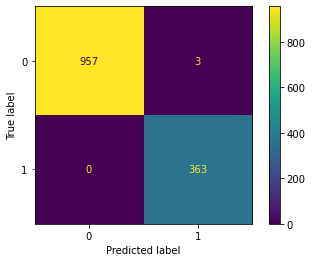

In [10]:
# Plotting confusion matrix
threshold = 0.3
predicted_proba = rfc.predict_proba(X_train_scaled)
predictions = (predicted_proba [:,1] >= threshold).astype('int')

ConfusionMatrixDisplay.from_predictions(Y_train, predictions)

# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_train, predictions))
print('Recall:', recall_score(Y_train, predictions))
print('F1:', f1_score(Y_train, predictions))

Precision: 0.4343891402714932
Recall: 0.6153846153846154
F1: 0.5092838196286472


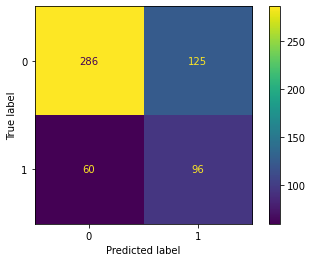

In [557]:
# Plotting confusion matrix
threshold = 0.3
predicted_proba = rfc.predict_proba(X_test_scaled)
predictions = (predicted_proba [:,1] >= threshold).astype('int')

ConfusionMatrixDisplay.from_predictions(Y_test, predictions)

# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_test, predictions))
print('Recall:', recall_score(Y_test, predictions))
print('F1:', f1_score(Y_test, predictions))

2do Modelo, el segundo modelo desarrollado se hizo con SVC y se cambiaron los diferentes hiperparámetros para lograr un mejor desempeño del modelo: los cambios que se tuvieron en cuenta fueron
- Se utilizaron diferentes opciones para el Kernel: ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’; el mejor resultado de Recall y F1 Score fue linear
- cambiamos probability de False a True y no hubo diferencia significativa
- class_weight: Dado que la clases estaban desbalanceadas 70% - 30%, se utilizó el balanced
- Se probaron hasta nivel 4 de polinomialidad, pero en lugar de mejorar el resultado de Recall, disminuì considerablemente


In [583]:
m2 = SVC(class_weight='balanced', kernel = 'linear')
m2.fit(X_train_scaled, Y_train)

# Predict the Test set results



SVC(class_weight='balanced', kernel='linear')

Precision: 0.4148471615720524
Recall: 0.6089743589743589
F1: 0.4935064935064935


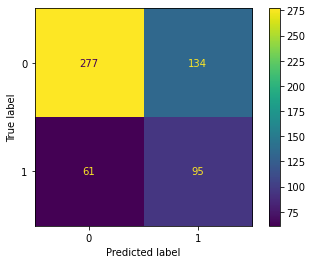

In [584]:
predictions = rfc.predict(X_test_scaled)
# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_test, predictions))
print('Recall:', recall_score(Y_test, predictions))
print('F1:', f1_score(Y_test, predictions)) #0.5899

# Plotting confusion matrix
ConfusionMatrixDisplay.from_predictions(Y_test, predictions)#0.23

Precision: 0.45321100917431195
Recall: 0.6804407713498623
F1: 0.5440528634361234


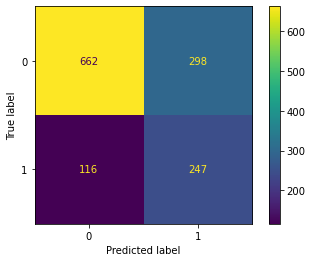

In [573]:
predictions = rfc.predict(X_train_scaled)
# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_train, predictions))
print('Recall:', recall_score(Y_train, predictions))
print('F1:', f1_score(Y_train, predictions)) #0.5899

# Plotting confusion matrix
ConfusionMatrixDisplay.from_predictions(Y_train, predictions)#0.23

3r Modelo, el 3er modelo desarrollado se hizo con Logistic Regression y se cambiaron los diferentes hiperparámetros para lograr un mejor desempeño del modelo: los cambios que se tuvieron en cuenta fueron
- Se utilizaron diferentes opciones para el solver: ‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’; el mejor resultado de Recall y F1 Score fue ‘sag’
- Se disminuyeron la cantidad maxima de iteraciones desde 100 y se obtuvo que el mejor resultado se consiigue con 23
- class_weight: Dado que la clases estaban desbalanceadas 70% - 30%, se utilizó el balanced
- Se probaron hasta nivel 4 de polinomialidad, pero en lugar de mejorar el resultado de Recall, disminuì considerablemente

In [594]:
logit = LogisticRegression(penalty = 'l2', solver='sag',class_weight = 'balanced', random_state = 80, max_iter = 23) # 1  0.6 - 2:0.46= Recall: 0.73 F1: 0.48 - 1:0.41= Recall: 0.77 F1: 0.49
logit.fit(X_train_scaled, Y_train)

/Users/salomonnovoamontenegro/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LogisticRegression(class_weight='balanced', max_iter=23, random_state=80,
                   solver='sag')

Precision: 0.3868421052631579
Recall: 0.8099173553719008
F1: 0.5235975066785395


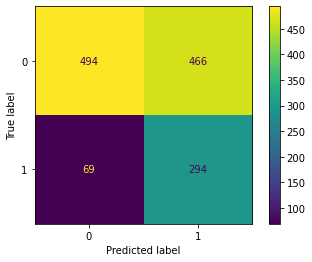

In [595]:
# Plotting confusion matrix
threshold = 0.41
predicted_proba = logit.predict_proba(X_train_scaled)
predictions = (predicted_proba [:,1] >= threshold).astype('int')

ConfusionMatrixDisplay.from_predictions(Y_train, predictions)

# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_train, predictions))
print('Recall:', recall_score(Y_train, predictions))
print('F1:', f1_score(Y_train, predictions)) #0.5899

Precision: 0.36645962732919257
Recall: 0.7564102564102564
F1: 0.49372384937238495


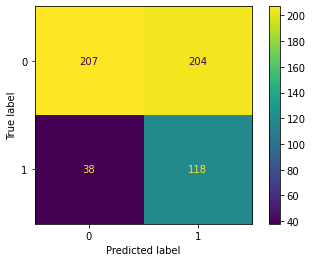

In [596]:
# Plotting confusion matrix
threshold = 0.41
predicted_proba = logit.predict_proba(X_test_scaled)
predictions = (predicted_proba [:,1] >= threshold).astype('int')

ConfusionMatrixDisplay.from_predictions(Y_test, predictions)

# Calculating confusion matrix derived metrics
print('Precision:', precision_score(Y_test, predictions))
print('Recall:', recall_score(Y_test, predictions))
print('F1:', f1_score(Y_test, predictions)) #0.5899

Dado que para Sempli, es más grave aceptar crèditos de empresas con mayor propensión a quedar en mora, se tomó como medida principal el Recall y como medida secundaria el F1; dado que el Recall, permite
hacer comparaciones con base en los Falsos negativos. 
Por esta razòn y comparando los diferntes resultados de los tres mejores modelos escogidos, se escoge como modelo para calcular la propensión, la Regresión Logística.

Habiendo escogido el modelo, se realizó comparación de Underfitting y Overfitting, y comparando las métricas para los datos train y test
Train
Precision: 0.3868421052631579
Recall: 0.8099173553719008
F1: 0.5235975066785395

Test
Precision: 0.36645962732919257
Recall: 0.7564102564102564
F1: 0.49372384937238495

Se evidencia que no hay sobreajuste ni subajuste.

Igualmente, se procede a realizar un análisis de importancia de variables, lo cual se puede identificar midiendo el impacto y la magnitud absoluta de los coeficientes estandirazados 

In [597]:

columns = list(X.columns)
#coef_pol = dict(zip(columns, ))

pd.DataFrame(logit.coef_, columns=columns).T.reset_index()

,index,0
0,Tasa de Interés,0.240353
1,Sempli Score,-0.377234
2,Año de Constitución,0.259506
3,Estrato,-0.153408
4,Valor OK_101 a 200,0.006366
5,Valor OK_201 a 300,-0.092746
6,Valor OK_301 a 400,-0.088933
7,Valor OK_401 en adelante,-0.158339
8,Plazo OK_13 a 24,0.306101
9,Plazo OK_25 a 36,0.280986
